## A quick walkthrough of our training strategies

### Supervised learning

Here we use a simple manually annotated dataset to train the ML models. 

The red regions in the spectrogram data are zero-padded regions to ensure the spectrogram field has the correct dimensions for several of the models used in this work. 

In [2]:
import matplotlib.pyplot as plt

from reverb.training.utils import get_supervised_dataloaders, DEFAULT_DATA_KWARGS

root_dir = '../segmentation/model_training/data'
train_dataloader, _ = get_supervised_dataloaders(root_dir, data_kwargs=DEFAULT_DATA_KWARGS, batch_size=12)

loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
loading annotations into memory...
Done (t=0.04s)
creating index...
index created!


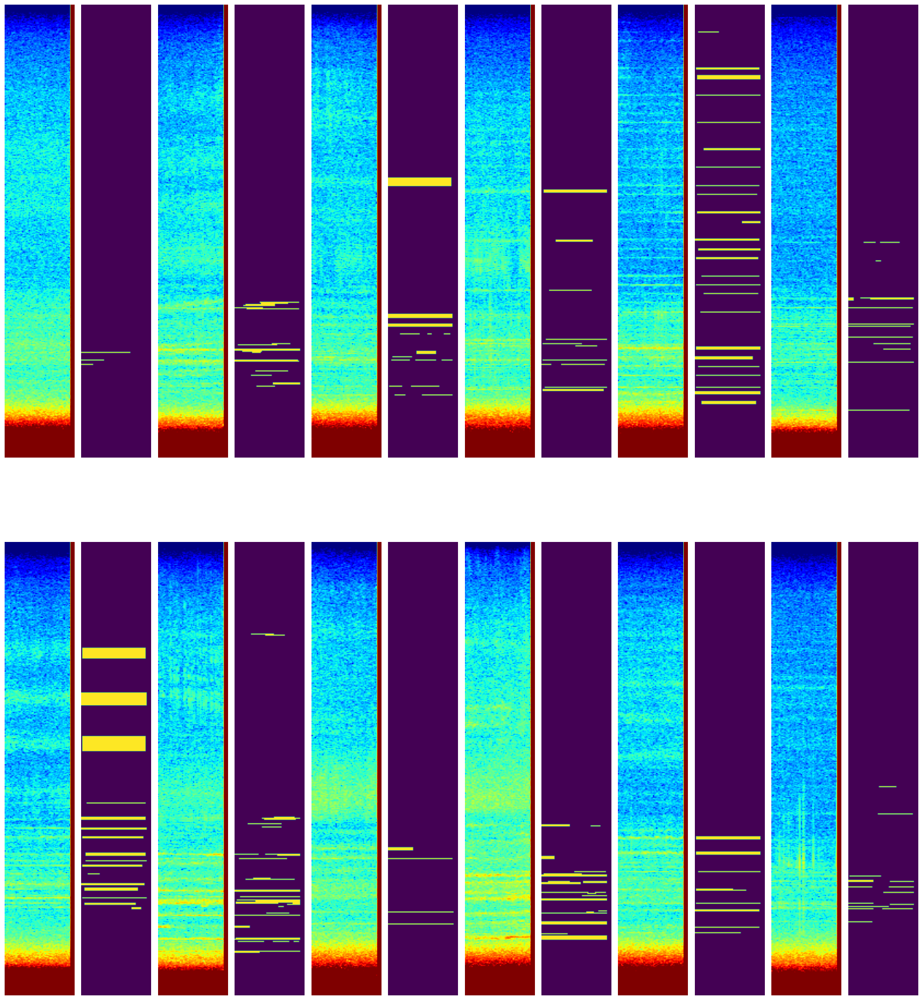

In [6]:
images, masks = next(iter(train_dataloader))
fig, axes = plt.subplots(2, 12, figsize=(20, 25))
axes = axes.flatten()
for i in range(12):
    axes[2*i].imshow(images[i].squeeze(0), cmap='jet')
    axes[2*i+1].imshow(masks[i].squeeze(0))
    axes[2*i].axis('off')
    axes[2*i+1].axis('off')
plt.tight_layout()
plt.show()


### Semi-supervised learning

We use [custom PyTorch dataset](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html) to fit our training data augmentation strategies etc.. Each item of the dataset consists of an image and a corresponding segmentation map.

In [5]:
from reverb.training.utils import get_semi_supervised_dataloaders

data_kwargs = {**DEFAULT_DATA_KWARGS, "unlabelled_dir": "../../_labelling_/spectrogam_generation/unsupervised_files"}
train_dataloader, _ = get_semi_supervised_dataloaders(root_dir, data_kwargs=data_kwargs)

loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!


Semi-supervised learning uses both labelled and unlabelled training data. The labelled data is used in the normal way for supervised training, while unlabelled data is used to improve robustness to unseen data and noise. 

Here, we add noise to the unlabelled data and use two views of it to enforce consistency between the network outputs. Examples of augmented unlabelled data are shown here.

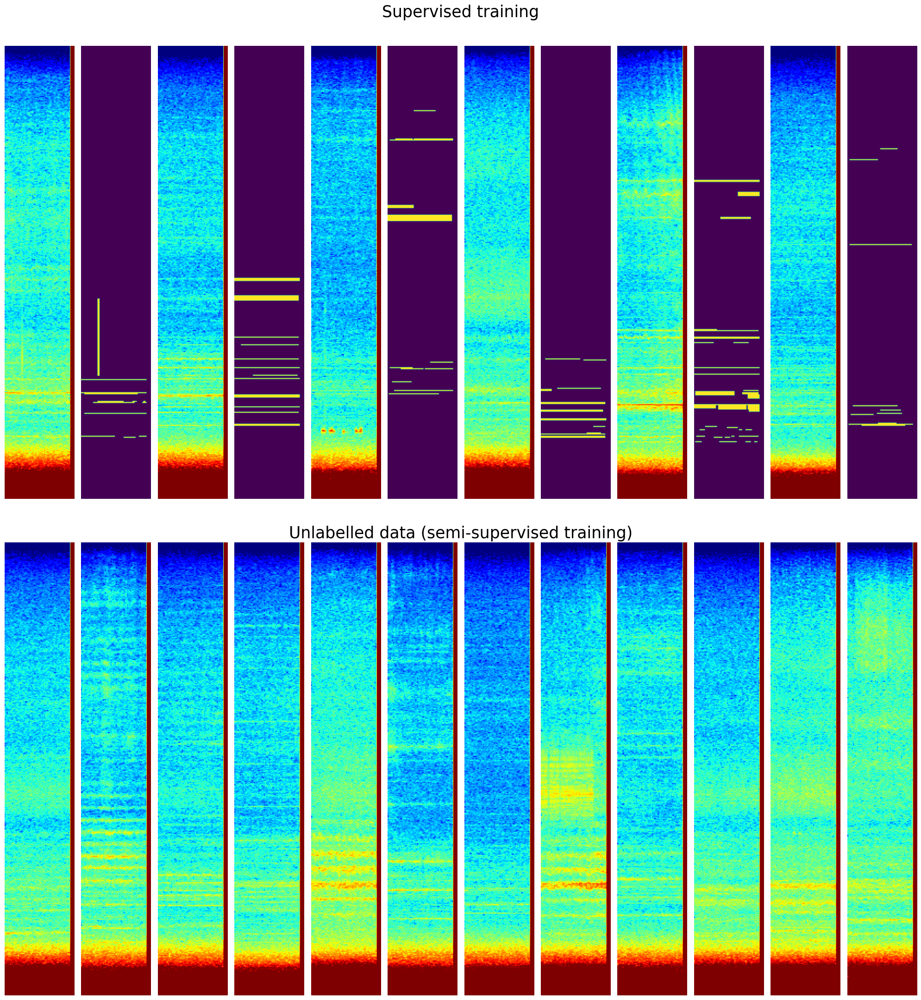

In [8]:
(labeled_images, labeled_masks), unlabelled_images = next(iter(train_dataloader))
fig, axes = plt.subplots(2, 12, figsize=(20, 25))
axes = axes.flatten()

# First row: labeled image-mask pairs (6 pairs = 12 plots)
for i in range(6):
    axes[2*i].imshow(labeled_images[i].squeeze(0), cmap='jet')
    axes[2*i+1].imshow(labeled_masks[i].squeeze(0))
    axes[2*i].axis('off')
    axes[2*i+1].axis('off')

# Second row: unlabelled images
for i in range(12):
    axes[i+12].imshow(unlabelled_images[i].squeeze(0), cmap='jet')
    axes[i+12].axis('off')

# Add row titles
fig.text(0.5, 0.9, 'Supervised training', ha='center', fontsize=25)
fig.text(0.5, 0.45, 'Unlabelled data (semi-supervised training)', ha='center', fontsize=25)

plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()


### Transfer learning

We utilise real, signal free spectrograms, combined with synthetic signals and added noise to create semi-realistic mock training data. This is used to pre-train the deep neural network to improve its performance on our small manually annotated dataset.

In [6]:
from reverb.training.utils import get_synthetic_dataloaders

background_dir= root_dir + "/low_res_backgrounds"
train_dataloader, _ = get_synthetic_dataloaders(root_dir, background_dir, data_kwargs, batch_size=12)

loading annotations into memory...
Done (t=0.26s)
creating index...
index created!


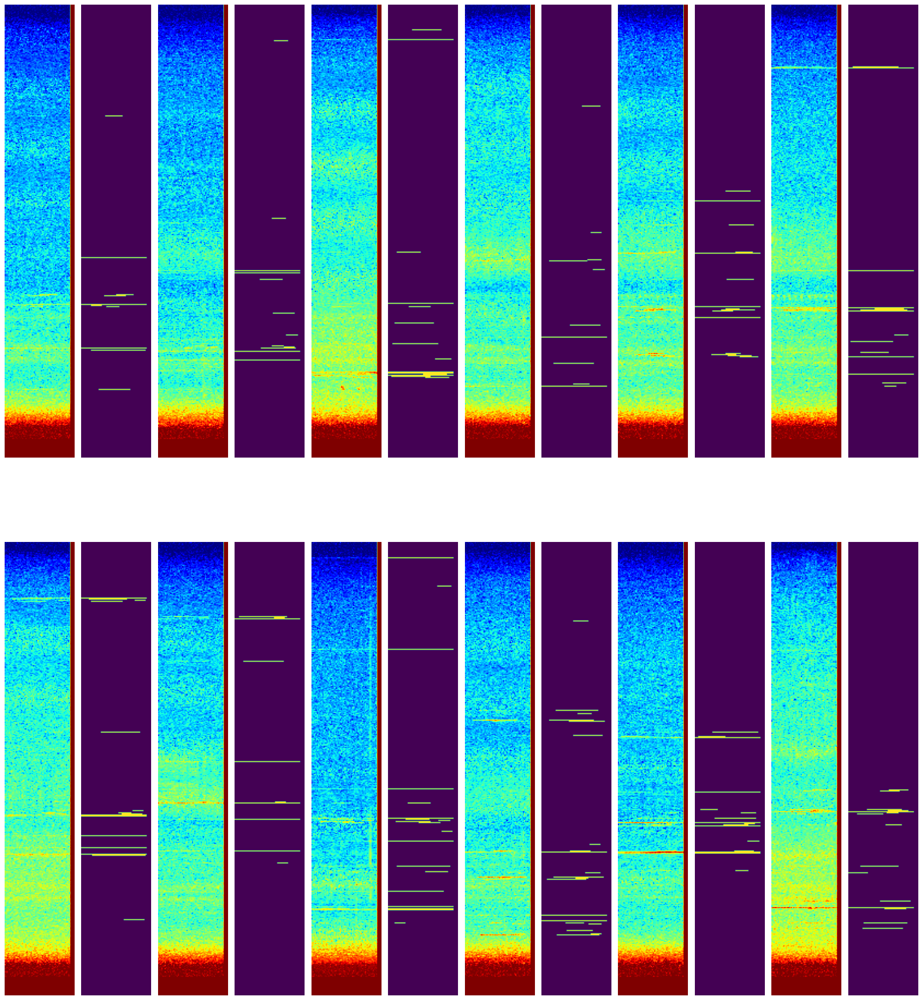

In [11]:
images, masks = next(iter(train_dataloader))
fig, axes = plt.subplots(2, 12, figsize=(20, 25))
axes = axes.flatten()
for i in range(12):
    axes[2*i].imshow(images[i].squeeze(0), cmap='jet')
    axes[2*i+1].imshow(masks[i].squeeze(0))
    axes[2*i].axis('off')
    axes[2*i+1].axis('off')
plt.tight_layout()
plt.show()
